In [1]:
import folium

In [13]:
#from pyproj import CRS
import fiona.crs
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import requests
import geojson
import urllib.request as request

In [3]:
def get_census_bounds():
    url = 'https://opendata.arcgis.com/datasets/de58dc3e1efc49b782ab357e044ea20c_9.geojson'
    bounds = gpd.read_file(url)
    return bounds

In [4]:
census_bounds = get_census_bounds()
census_bounds.head()

,OBJECTID,TRACT,TRACTCE10,GEOID10,NAME10,NAMELSAD10,ACRES_TOTAL,WATER,SHAPE_Length,SHAPE_Area,geometry
0,1,2500,002500,53033002500,25,Census Tract 25,243.219083,0,16442.968402,1.059462e+07,"POLYGON ((-122.29602 47.69023, -122.29608 47.6..."
1,2,2600,002600,53033002600,26,Census Tract 26,307.584420,0,15936.137058,1.339838e+07,"POLYGON ((-122.30817 47.69031, -122.30947 47.6..."
2,3,5600,005600,53033005600,56,Census Tract 56,737.511727,0,30337.294354,3.212601e+07,"POLYGON ((-122.39300 47.63956, -122.39421 47.6..."
3,4,6800,006800,53033006800,68,Census Tract 68,177.438771,0,11275.376490,7.729233e+06,"POLYGON ((-122.35070 47.63994, -122.35130 47.6..."
4,5,6000,006000,53033006000,60,Census Tract 60,324.567432,0,19729.922875,1.413816e+07,"POLYGON ((-122.34279 47.64320, -122.34280 47.6..."


In [5]:
url_list = ['https://opendata.arcgis.com/datasets/7015d5d46a284f94ac05c2ea4358bcd7_0.geojson',
            'https://opendata.arcgis.com/datasets/5fc63b2a48474100b560a7d98b5097d7_1.geojson',
            'https://opendata.arcgis.com/datasets/27af9a2485c5442bb061fa7e881d7022_2.geojson',
            'https://opendata.arcgis.com/datasets/4f62515558174f53979b3be0335004d3_3.geojson',
            'https://opendata.arcgis.com/datasets/29f801d03c9b4b608bca6a8e497278c3_4.geojson',
            'https://opendata.arcgis.com/datasets/a0019dd0d6464747a88921f5e103d509_5.geojson',
            'https://opendata.arcgis.com/datasets/40bcfbc4054549ebba8b5777bbdd40ff_6.geojson',
            'https://opendata.arcgis.com/datasets/16cedd233d914118a275c6510115d466_7.geojson',
            'https://opendata.arcgis.com/datasets/902fd604ecf54adf8579894508cacc68_8.geojson',
            'https://opendata.arcgis.com/datasets/170b764c52f34c9497720c0463f3b58b_9.geojson',
            'https://opendata.arcgis.com/datasets/2c37babc94d64bbb938a9b520bc5538c_10.geojson',
            'https://opendata.arcgis.com/datasets/a35aa9249110472ba2c69cc574eff984_11.geojson']

In [6]:
def get_gdf(year):
    '''Enter the desired year to download the traffic flow count
    data for that year. Example: enter '7' for the year 2007.
    '''
    num = year-7
    gdf_year = gpd.read_file(url_list[num])
    if year == 11:
        gdf_year = gdf_year.rename(columns={"YEAR_" : 'YEAR'})
    if year == 12:
        gdf_year = gdf_year.rename(columns={'STDY_YEAR' : 'YEAR'})
    if year == 15 or year == 16:
        gdf_year = gdf_year.rename(columns={"COUNTAAWDT" : 'AAWDT', "FLOWSEGID" : "GEOBASID", 'FIRST_STNAME_ORD' : 'STNAME'})
        gdf_year = gdf_year[['AAWDT', 'GEOBASID', 'STNAME', 'SHAPE_Length', 'geometry']]
        if year == 15:
            year_list = ['2015']*len(gdf_year)
            gdf_year['YEAR'] = year_list
        elif year == 16:
            year_list = ['2016']*len(gdf_year)
            gdf_year['YEAR'] = year_list
    elif year == 17 or year == 18:
        gdf_year = gdf_year.rename(columns={"AWDT" : 'AAWDT', "FLOWSEGID" : "GEOBASID", 'STNAME_ORD' : 'STNAME'})
        gdf_year = gdf_year[['AAWDT', 'GEOBASID', 'STNAME', 'SHAPE_Length', 'geometry']]
        if year == 17:
            year_list = ['2017']*len(gdf_year)
            gdf_year['YEAR'] = year_list
        elif year == 18:
            year_list = ['2018']*len(gdf_year)
            gdf_year['YEAR'] = year_list
    #df_year_AAWDT = df_year['AAWDT'].values
    #df_year_geobase = df_year['GEOBASID'].values
    #df_year_dist = df_year['SHAPE_Length'].values
    gdf_year = gdf_year[[ 'YEAR', 'AAWDT', 'GEOBASID', 'STNAME', 'SHAPE_Length', 'geometry']]
    return gdf_year #, df_year_AAWDT, df_year_geobase, df_year_dist

In [7]:
gdf_15 = get_gdf(15)

In [8]:
tracts_by_street = gpd.sjoin(gdf_15, census_bounds, op='intersects')

In [9]:
tracts_by_street.head()

,YEAR,AAWDT,GEOBASID,STNAME,SHAPE_Length_left,geometry,index_right,OBJECTID,TRACT,TRACTCE10,GEOID10,NAME10,NAMELSAD10,ACRES_TOTAL,WATER,SHAPE_Length_right,SHAPE_Area
0,2015,24000.000000,2028.0,W SEA BR EB 4 AV OFF RP,1458.971527,"LINESTRING (-122.33092 47.57152, -122.33054 47...",97,141,9300,009300,53033009300,93,Census Tract 93,2341.806557,0,53536.277831,1.020091e+08
9,2015,10000.000000,2040.0,S SPOKANE CR ST,74.907110,"LINESTRING (-122.32599 47.57156, -122.32569 47...",97,141,9300,009300,53033009300,93,Census Tract 93,2341.806557,0,53536.277831,1.020091e+08
28,2015,2000.000000,2002.0,4TH AV NB ON RP,362.035102,"LINESTRING (-122.32905 47.58934, -122.32926 47...",97,141,9300,009300,53033009300,93,Census Tract 93,2341.806557,0,53536.277831,1.020091e+08
29,2015,7000.000000,2003.0,AIRPORT WAY S,480.942822,"LINESTRING (-122.32248 47.59018, -122.32248 47...",97,141,9300,009300,53033009300,93,Census Tract 93,2341.806557,0,53536.277831,1.020091e+08
30,2015,22250.085611,2004.0,15TH AVE S,1847.192651,"LINESTRING (-122.31658 47.59428, -122.31697 47...",97,141,9300,009300,53033009300,93,Census Tract 93,2341.806557,0,53536.277831,1.020091e+08


In [13]:
sarahs_house_2015 = tracts_by_street.loc[tracts_by_street['NAME10'] == '51']

<AxesSubplot:>

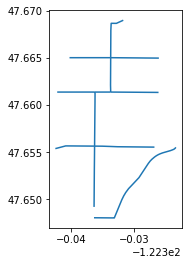

In [14]:
sarahs_house_2015.plot()

In [10]:
city_by_tract = gpd.sjoin(census_bounds, gdf_15, op='intersects')

In [11]:
traffic_zones = city_by_tract.dissolve(by='NAME10', aggfunc = sum)
traffic_zones.reset_index(inplace = True)
traffic_zones.head()

,NAME10,geometry,OBJECTID,TRACT,ACRES_TOTAL,WATER,SHAPE_Length_left,SHAPE_Area,index_right,AAWDT,GEOBASID,SHAPE_Length_right
0,1,"POLYGON ((-122.29654 47.73198, -122.29653 47.7...",720,900,4112.343263,0,176314.350925,1.791337e+08,1061,200687.184322,17120.0,25773.238234
1,10,"POLYGON ((-122.30218 47.70163, -122.30191 47.7...",900,12000,2830.027985,0,159656.693109,1.232760e+08,2098,190009.612137,22138.0,20707.485662
2,100.01,"POLYGON ((-122.31733 47.56350, -122.31728 47.5...",3550,250025,14295.841848,0,630717.017684,6.227269e+08,38674,356718.912824,9273.0,49928.137400
3,100.02,"POLYGON ((-122.31607 47.58094, -122.31606 47.5...",3480,240048,5623.463779,0,337182.984453,2.449581e+08,34910,262826.787822,9538.0,28647.309002
4,101,"POLYGON ((-122.29690 47.56783, -122.29690 47.5...",1716,121200,7398.108461,0,317183.131272,3.222616e+08,18642,176011.905119,4158.0,41475.173480


In [18]:
traffic_zones.crs = fiona.crs.from_epsg(4326)
traffic_zones.crs

<Geographic 2D CRS: +init=epsg:4326 +no_defs +type=crs>
Name: WGS 84
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [58]:
traffic_zones = traffic_zones[['GEOBASID', 'AAWDT', 'NAME10', 'geometry']]
#traffic_zones_json = traffic_zones.to_json()
#traffic_zones_json

In [25]:
type(traffic_zones['AAWDT'][0])

numpy.float64

In [47]:
variable = 'AAWDT'
traffic_zones=traffic_zones.sort_values(by=variable, ascending=True)
colormap = folium.LinearColormap(colors=['green','yellow','red'], vmin=traffic_zones[variable].min(),
                                 vmax=traffic_zones[variable].max()).to_step(n=10)
colormap.caption = "2015 Seattle Traffic Flow Counts"

In [19]:
centroid=traffic_zones.geometry.centroid

<ipython-input-19-987927e6528d>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid=traffic_zones.geometry.centroid


In [48]:
centroid=traffic_zones.geometry.centroid

m=folium.Map(location=[centroid.y.mean(), centroid.x.mean()], zoom_start=10, tiles='cartodbpositron')

folium.GeoJson(traffic_zones[['geometry','NAME10',variable]],
               name='Average Annual Weekly Daily Traffic Flow 2015',
               style_function=lambda x: {"weight":0.5, 'color':'white','fillColor':colormap(x['properties'][variable]), 'fillOpacity':0.4},
              highlight_function=lambda x: {'weight':3, 'color':'black'},
               smooth_factor=2.0,
              tooltip=folium.features.GeoJsonTooltip(fields=['NAME10',variable],
                                              aliases=['Census Tract','2015 Aggregate Traffic Flow'], 
                                              labels=True, 
                                              sticky=True,
                                              toLocaleString=True
                                             )
              ).add_to(m)


colormap.add_to(m)

folium.LayerControl(autoZIndex=True, collapsed=True).add_to(m)

m

<ipython-input-48-e52a45f4513c>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid=traffic_zones.geometry.centroid


In [49]:
outfp = "choropleth_map_v2.html"
m.save(outfp)

In [61]:
# Create a Map instance
m = folium.Map(location=[47.65, -122.3], tiles = 'cartodbpositron', zoom_start=10, control_scale=True)

# Plot a choropleth map
# Notice: 'geoid' column that we created earlier needs to be assigned always as the first column
folium.Choropleth(
    geo_data=traffic_zones_json,
    name='Average Annual Weekly Daily Traffic Flow 2015',
    data=traffic_zones,
    columns=['GEOBASID', 'AAWDT'],
    key_on='feature.properties.GEOBASID',
    fill_color='RdYlBu_r',
    fill_opacity=0.7,
    line_opacity=0.2,
    line_color='white', 
    line_weight=2,
    highlight=False, 
    smooth_factor=1.0,
    #threshold_scale=[100, 250, 500, 1000, 2000],
    legend_name= 'Traffic Counts').add_to(m)

#Show map
m

In [72]:
# Convert points to GeoJson
folium.features.GeoJson(traffic_zones,  
                        name='Labels',
                        style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        tooltip=folium.features.GeoJsonTooltip(fields=['AAWDT'],
                                                                aliases = ['Traffic Count'],
                                                                labels=True,
                                                                sticky=False
                                                                            )
                       ).add_to(m)

m

In [73]:
outfp = "choropleth_map.html"
m.save(outfp)

In [32]:
import altair as alt
import json

alt.themes.enable('opaque')




ThemeRegistry.enable('opaque')

In [43]:
traffic_zones['centroid_lon'] = traffic_zones['geometry'].centroid.x
traffic_zones['centroid_lat'] = traffic_zones['geometry'].centroid.y
traffic_zones.head()

<ipython-input-43-36737b98dbea>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  traffic_zones['centroid_lon'] = traffic_zones['geometry'].centroid.x
<ipython-input-43-36737b98dbea>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  traffic_zones['centroid_lat'] = traffic_zones['geometry'].centroid.y


,GEOBASID,AAWDT,NAME10,geometry,centroid_lon,centroid_lat
0,17120.0,200687.184322,1,"POLYGON ((-122.29654 47.73198, -122.29653 47.7...",-122.288742,47.726278
1,22138.0,190009.612137,10,"POLYGON ((-122.30218 47.70163, -122.30191 47.7...",-122.296063,47.706409
2,9273.0,356718.912824,100.01,"POLYGON ((-122.31733 47.56350, -122.31728 47.5...",-122.305026,47.567995
3,9538.0,262826.787822,100.02,"POLYGON ((-122.31607 47.58094, -122.31606 47.5...",-122.309571,47.576581
4,4158.0,176011.905119,101,"POLYGON ((-122.29690 47.56783, -122.29690 47.5...",-122.283006,47.566149


In [49]:
choro_json = json.loads(traffic_zones.to_json())
choro_data = alt.Data(values=choro_json['features'])

In [50]:
choro_json

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'AAWDT': 200687.18432167,
    'GEOBASID': '17120.0',
    'NAME10': '1',
    'centroid_lat': 47.726278048634015,
    'centroid_lon': -122.28874182322292},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-122.29654280914816, 47.731976843644134],
      [-122.29653281201867, 47.73271384386997],
      [-122.29651881766966, 47.73378577054734],
      [-122.29651875232784, 47.73378577048598],
      [-122.29651058393215, 47.73378569175491],
      [-122.29605269818178, 47.733782006501286],
      [-122.29530481701346, 47.73377584582912],
      [-122.2951768546906, 47.733774951775864],
      [-122.29512466548917, 47.73377453123931],
      [-122.29469081726049, 47.73377084731059],
      [-122.29380881673606, 47.733763849276926],
      [-122.29293276104057, 47.73375684391769],
      [-122.2924334514939, 47.73375280882039],
      [-122.29214019775779, 47.733750438148256],
      [-122.2910968163171

In [55]:
def gen_map(geodata, color_column, title):
    '''Generates Seattle map with traffic data choropleth and labels'''
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=400,
        height=400
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        #fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme='bluegreen'),
                  title = "Traffic Counts")
    )
    # Add Labels Layer
    labels = alt.Chart(geodata).mark_text(baseline='top'
     ).properties(
        width=400,
        height=400
     ).encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.NAME10:O',
         size=alt.value(8),
         opacity=alt.value(1)
     )

    return base + choro + labels

seattle_2015_traffic_map = gen_map(geodata=choro_data, color_column='properties.AAWDT', title='2015')
seattle_2015_traffic_map

alt.LayerChart(...)

In [17]:
import osmnx as ox
import networkx as nx
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from pyproj import CRS

In [ ]:
place_name = "Seattle, Washington, USA"
graph = ox.graph_from_place(place_name, network_type='drive')

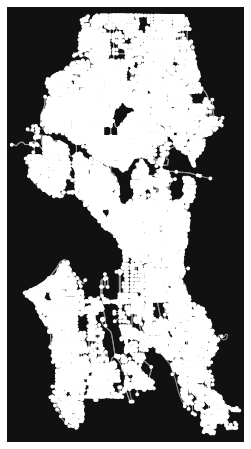

In [23]:
fig, ax = ox.plot_graph(graph)

In [24]:
# Retrieve only edges from the graph
edges = ox.graph_to_gdfs(graph, nodes=False, edges=True)

In [25]:
# Check columns
edges.columns

Index(['osmid', 'oneway', 'lanes', 'ref', 'highway', 'maxspeed', 'length',
       'geometry', 'bridge', 'name', 'tunnel', 'junction', 'width', 'access'],
      dtype='object')

In [26]:
# Check crs
edges.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
edges.head()

osmid  oneway  \
u        v          key                                                        
29445663 335444348  0                                        4634309    True   
         29485641   0                                      608025479    True   
29447670 720880672  0                   [40416106, 4635028, 4634847]    True   
         4240312871 0    [424636848, 40416108, 143178398, 424807772]    True   
29449412 29449538   0                           [531617225, 4634838]    True   

                             lanes     ref        highway          maxspeed  \
u        v          key                                                       
29445663 335444348  0            2  WA 520  motorway_link            60 mph   
         29485641   0            3     I 5       motorway            60 mph   
29447670 720880672  0    [2, 3, 1]     NaN  motorway_link               NaN   
         4240312871 0            2  WA 520       motorway            60 mph   
29449412 29449538   0            1     NaN  motorway_link  [40 mph, 50 mph]   

                          length  \
u        v          key            
29445663 335444348  0    636.024   
         29485641   0    688.835   
29447670 720880672  0    368.174   
         4240312871 0    724.798   
29449412 29449538   0    185.968   

                                                                  geometry  \
u        v          key                                                      
29445663 335444348  0    LINESTRING (-122.32263 47.63854, -122.32251 47...   
         29485641   0    LINESTRING (-122.32263 47.63854, -122.32257 47...   
29447670 720880672  0    LINESTRING (-122.30891 47.64331, -122.30805 47...   
         4240312871 0    LINESTRING (-122.30891 47.64331, -122.30663 47...   
29449412 29449538   0    LINESTRING (-122.31677 47.64293, -122.31783 47...   

                          bridge                           name tunnel  \
u        v          key                                                  
29445663 335444348  0        NaN                            NaN    NaN   
         29485641   0        NaN                            NaN    NaN   
29447670 720880672  0    viaduct                            NaN    NaN   
         4240312871 0    viaduct  [WA 520, Portage Bay Viaduct]    yes   
29449412 29449538   0    viaduct                            NaN    NaN   

                        junction width access  
u        v          key                        
29445663 335444348  0        NaN   NaN    NaN  
         29485641   0        NaN   NaN    NaN  
29447670 720880672  0        NaN   NaN    NaN  
         4240312871 0        NaN   NaN    NaN  
29449412 29449538   0        NaN   NaN    NaN

In [29]:
edges['bridge'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas/_libs/hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


yes               434
viaduct            23
[movable, yes]      8
[yes, viaduct]      4
movable             2
Name: bridge, dtype: int64

In [30]:
# Project the data
graph_proj = ox.project_graph(graph) 

In [31]:
# Get Edges and Nodes
nodes_proj, edges_proj = ox.graph_to_gdfs(graph_proj, nodes=True, edges=True)

In [32]:
print("Coordinate system:", edges_proj.crs)

Coordinate system: +proj=utm +zone=10 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


In [33]:
# Calculate network statistics
stats = ox.basic_stats(graph_proj, circuity_dist='euclidean')
stats

{'n': 15654,
 'm': 45738,
 'k_avg': 5.8436182445381375,
 'intersection_count': 13632,
 'streets_per_node_avg': 3.1246965631787402,
 'streets_per_node_counts': {0: 0,
  1: 2022,
  2: 131,
  3: 7556,
  4: 5782,
  5: 145,
  6: 17,
  7: 1},
 'streets_per_node_proportion': {0: 0.0,
  1: 0.12916826370256804,
  2: 0.008368468123163409,
  3: 0.48268813082918105,
  4: 0.3693624632681743,
  5: 0.009262808227928963,
  6: 0.0010859844129296027,
  7: 6.388143605468251e-05},
 'edge_length_total': 5564240.829999922,
 'edge_length_avg': 121.65465980147627,
 'street_length_total': 2990059.1639999864,
 'street_length_avg': 122.40795693290156,
 'street_segments_count': 24427,
 'node_density_km': None,
 'intersection_density_km': None,
 'edge_density_km': None,
 'street_density_km': None,
 'circuity_avg': 1.0255716214183224,
 'self_loop_proportion': 0.0008089553544098998,
 'clean_intersection_count': None,
 'clean_intersection_density_km': None}

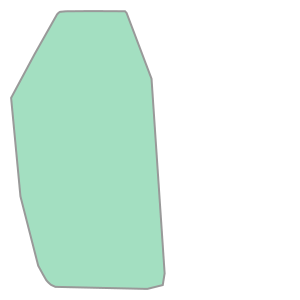

In [34]:
# Get the Convex Hull of the network
convex_hull = edges_proj.unary_union.convex_hull

# Show output
convex_hull

In [ ]:
# Calculate the area
area = convex_hull.area

# Calculate statistics with density information
stats = ox.basic_stats(graph_proj, area=area)
extended_stats = ox.extended_stats(graph_proj, ecc=True, cc=True)

# Add extened statistics to the basic statistics
for key, value in extended_stats.items():
    stats[key] = value
    
# Convert the dictionary to a Pandas series for a nicer output
pd.Series(stats)

In [38]:
fp = "2015_Traffic_Flow.geojson"

# Read the GeoJSON file similarly as Shapefile
acc = gpd.read_file(fp)

# Let's see what we have
acc.head()

,OBJECTID,COUNT_COMPKEY,FIRST_STNAME_ORD,FIRST_ARTDESCRIPT,FIRST_TRANDESCRIPT,COUNTFLAG,FLOWSEGID,DOWNTOWN,COUNTSTART,COUNTAADT,COUNTAAWDT,ESTIMATE,AWDT_ROUND,SHAPE_Length,geometry
0,1,None,W SEA BR EB 4 AV OFF RP,None,None,Y,2028.0,N,None,NaN,24000.0,Y,24000,1458.971527,"LINESTRING (-122.33092 47.57152, -122.33054 47..."
1,2,None,MYERS WAY S,None,None,Y,2029.0,N,None,NaN,38000.0,Y,38000,335.499087,"LINESTRING (-122.33484 47.52232, -122.33482 47..."
2,3,None,S CLOVERDALE ST,None,None,Y,2030.0,N,None,NaN,13000.0,Y,13000,987.546181,"LINESTRING (-122.32820 47.52648, -122.32961 47..."
3,4,None,S CLOVERDALE ST,None,None,Y,2031.0,N,None,NaN,11000.0,Y,11000,1305.323633,"LINESTRING (-122.32292 47.52647, -122.32377 47..."
4,5,None,M L KING JR WAY S,None,None,Y,2032.0,N,None,NaN,12200.0,Y,12200,609.897683,"LINESTRING (-122.28085 47.53540, -122.28087 47..."


In [39]:
type(acc)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot:>

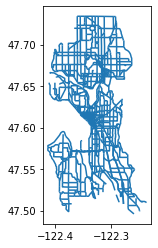

In [40]:
acc.plot()